# BIMM 143 Project 2: Lani Kaida

### Scientific question: What are the evolutionary relationships between the four penguins of the Spheniscus genus based on the sequence of their NADH dehydrogenase subunit 1?

Penguins (family Spheniscidae) comprise of 18 currently living species, separated into 6 genuses (Baker et al., 2006). To this day, the evolutionary relationships still remain unclear.

One method of determining evolutionary relationships of different species is through examining the similarity of their genomes. However, a task like that is too much for the scope of this class, so another option is examining not the entire genome, but rather a certain gene that varies across species. The gene I have chosen encodes for the NADH dehydrogenase complex 1, or ND1. Complex 1 is the largest enzyme in the mitochondrial electron transfer chain, and it oxidizes NADH, transferring two electrons to ubiquinone and reelases 4 protons from the mitochondrial matrix into the intermembrane space (Clemson et al., 2010). Complex 1, in conjunction with 3 other enzyme complexes, keeps the proton-motive force going, which drives ATP synthesis (Clemson et al., 2010).

ND1 gene sequences were found on the NCBI website's gene database. (https://www.ncbi.nlm.nih.gov/gene/17674418: S.demersus, https://www.ncbi.nlm.nih.gov/gene/34950543: S.humboldti, https://www.ncbi.nlm.nih.gov/gene/34948485: S.mendiculus, https://www.ncbi.nlm.nih.gov/gene/34947307: S.magellanicus). As stated on the NCBI website, "The National Center for Biotechnology Information advances science and health by providing access to biomedical and genomic information."

### Scientific hypothesis: If based off of habitat proximity, then the Magellanic and Humboldt penguins are likely the most related, with the Galapagos and African penguins branching off earlier in time.

The four penguins of the Spheniscus genus live in southern Africa and South America (Baker et al., 2006). Specifically, the Magellanic (S.magellanicus) and Humboldt (S.humboldti) penguins are based on the South American coast, while the Galapagos penguin (S.mediculus) lives in the Galapagos and the African penguin (S.demersus) penguin on the southern tip of Africa (Pan et al., 2019).

However, habitat proximity alone is not conclusive to determine evolutionary relationships. Pairwise sequence alignment and multiple sequence alignment can be used to examine the similarity of the ND1 gene across the four Spheniscus genus penguins. ND1 gene sequences were saved as fasta files and then compared pairwise. One can infer that the species with the most amount of matches in their sequences (highest value under the "score" value in the pairwise sequence alignment) are the most closely related, and vice versa (species with the least amount of matches are the least closely related).

From there, multiple sequence alignment was performed to place the two species that were in the middle; neither the most closely related nor the most distantly related. In order to perform a multiple sequence alignment, the individual fasta files were compiled into one phylip file using MAFFT (https://mafft.cbrc.jp/alignment/server/). Then, a phylogenetic tree was constructed in order to visualize the results.

### Part 1: Load the packages

biopython: a set of freely available tools for biological computation written in Python. DNA and RNA sequences are held under the "Seq" class, which adds biological methods to those sequences on top of string-like behavior. Using biopython, one can do sequence aligments, population genetics, and structural bioinformatics, among other things. Here, it is used for pairwise sequence alignment and multiple sequence alignment. It is also used for constructing a phylogenetic tree with the TreeConstruction package. (https://biopython.org/wiki/Documentation)

In [ ]:
# importing packages for the pairwise sequence alignment
# biopython had already been installed prior for another assignment so its installation was not shown here.
# However, if one wanted to install biopython, they would type in !pip install bioypthon

In [4]:
from Bio import SeqIO
from Bio import pairwise2
from Bio.Seq import Seq
from Bio.pairwise2 import format_alignment

In [59]:
# importing packages for the multiple sequence alignment and the phylogenetic tree

In [60]:
from Bio import AlignIO
from Bio import Phylo
from Bio.Phylo.TreeConstruction import DistanceCalculator
from Bio.Phylo.TreeConstruction import DistanceTreeConstructor

### Part 2: Load in the data and perform bioinformatic analyses (pairwise sequence alignment & multiple sequence alignment)

THe fasta file format is a text-based format for representing nucleotide or amino acid sequences, with each nucleotide or amino acid being represented by a single letter code. Sequence names, species names, or comments can also be included, preceding the sequences.

In the code, we download fasta files for the four Spheniscus penguins' ND1 genes, saved as .txt files, downloaded from the NCBI gene database. The Seq class of the variable, which contains just the DNA sequence and none of the comments/sequence names, was printed to ensure it was saved correctly. The Seq variables were then compared pairwise, to determine the most and least closely related species. Following that, the sequences were compared in a multiple sequence alignment.

In [ ]:
# taking sequence data and saving it to global variables demersus, humboldti, magellanicus, and mendiculus

In [5]:
demersus = SeqIO.read("demersus_nadh1.txt", "fasta")
humboldti = SeqIO.read("humboldti_nadh1.txt", "fasta")
magellanicus = SeqIO.read("magellanicus_nadh1.txt", "fasta")
mendiculus = SeqIO.read("mendiculus_nadh1.txt", "fasta")

In [61]:
# printing the variables in Seq class to make sure it was saved correctly; this is a code check

In [7]:
print(demersus.seq)

ATGATTTGACATCCTATCTCAACTCATTTAGCCATATCCCTGTCCTATGCCATCCCAATCCTAATCGCAGTCGCTTACCTCACACTAGTAGAACGGAAAATCCTAAGCTACATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGAGCCCATTCGCCCATCTACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTGGCGATCACAATCTGAACACCCCTCCCACTCCCCTTCTCCCTCGCTGACCTAAACCTAGGCCTCCTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGATGGGCCTCAAACTCAAAATACGCCCTAATCGGTGCTTTGCGAGCAGTAGCACAGACGATCTCCTATGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACTAAGCGGAAACTACACCCTAACCACACTTACCACAGCCCAAGAGCCACTATACCTCATCTTCTCCTCTTGACCTCTTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGCCCCATTCGACCTAACAGAGGGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTGTTCTTCTTAGCCGAATATGCAAACATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAATCCAAGCTCACTCAACCCCTCCCCAGAATTATTCCCAATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTCCGGCTTCCTATGAATCCGTGCTTCCTACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAATTTTCTCCCACTAACACTAGCACTCTGCCTTTGACACATCAGCATGCCAATCTGCTGCGCAGGCCTACCCCCTTGCTCAAGG


In [8]:
print(humboldti.seq)

ATGATTTGACAACCTATCTCAACCCATTTAGCCATATCCCTGTCCTATGCCATCCCAATCCTAATCGCAGTCGCTTATCTCACACTAGTAGAACGAAAAATCCTAAGCTACATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAAGAGCCCATCCGCCCATCCACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTGGCGATCACAATCTGAACACCCCTCCCACTCCCCTTCTCCCTCGCCGACCTAAACCTAGGCCTTCTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGATGGGCCTCAAACTCAAAATACGCCCTAATCGGTGCCTTGCGAGCAGTAGCACAGACTATCTCCTACGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACTAAGCGGAAACTACACCCTAACCACACTTACCACAACCCAAGAACCACTATACCTCATCTTCTCCTCTTGGCCCCTTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGCTCCATTCGACCTGACAGAAGGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTATTCTTCTTAGCCGAATATGCAAATATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAATCCAAGCTCACTCAACCCCTCCCCAGAATTATTCCCAATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTTCGGCTTCTTATGAATCCGTGCTTCCTACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAATTTTCTCCCACTAACACTAGCGCTCTGCCTTTGACACATCAGCATGCCAATCTGCTGTGCAGGCCTACCCCCTTGCTCAAGG


In [9]:
print(magellanicus.seq)

ATGATTTGACATCCTATCTCAACTCATTTAGCCATATCCCTGTCCTATGCCATCCCAATCCTAATCGCAGTCGCTTACCTCACACTAGTAGAACGAAAAATCCTAAGCTACATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGAACCCATTCGTCCATCTACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTAGCGATCACAATCTGAACACCCCTCCCACTCCCCTTCTCCCTCGCCGACCTAAACCTAGGCCTTCTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGATGGGCCTCAAACTCAAAATACGCTCTAATCGGTGCTTTGCGAGCAGTAGCACAGACGATCTCCTATGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACTAAGCGGAAACTACACCCTAACCACACTTACCACAGCCCAAGAACCACTATACCTCATCTTCTCCTCTTGACCCCTTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGCTCCATTCGACCTGACAGAAGGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTGTTCTTCTTAGCCGAATATGCAAACATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAACCCAAGCTCACTCAACCCCTCCCCAGAATTATTCCCGATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTCCGGCTTCCTATGAATCCGTGCTTCTTACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAATTTTCTCCCACTAACACTAGCGCTCTGCCTTTGACACATCAGCATGCCAATCTGCTGCGCAGGCCTACCCCCTTGCTCAAGG


In [10]:
print(mendiculus.seq)

ATGATTTGACAACCTATCTCAACTCATTTAGCCATATCCCTATCCTATGCCATCCCAATCCTAATCGCAGTCGCCTACCTGACACTAGTAGAACGGAAAATCCTAAGCTATATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGAGCCCATTCGCCCATCCACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTGGCGATCACAATCTGAACGCCCCTCCCACTCCCCTTCTCCCTCACCGACCTAAACCTAGGCCTTCTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGGTGGGCCTCAAACTCAAAATACGCCCTAATCGGTGCCTTGCGAGCAGTAGCACAGACTATCTCCTATGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATATTAAGCGGAAACTACACCCTAACCACACTTACCACAACCCAAGAAACACTATACCTCATCTTCTCCTCCTGACCCCTTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGCGCTCCATTCGACCTGACAGAAGGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTGTTCTTCTTAGCCGAATACGCAAACATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAACCCAAGCTCACTCAACCCCTCCCCAGAGTTATTCCCAATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTCCGGCTTCCTATGAATCCGCGCTTCTTACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAACTTTCTCCCATTAACACTAGCACTCTGCCTTTGACACATCAGCATACCAATCTGCTGCGCAGGCCTACCCCCTTGCTCAAGG


In [ ]:
# defined global variable alignments and local variable alignment
# pairwise sequence alignment performed for each individual penguin pair to see which pair of species are the most and least related
# for the one below, pairwise sequence alignment between S.demersus and S.humboldti

In [12]:
alignments = pairwise2.align.globalxx(demersus.seq, humboldti.seq)
for alignment in alignments:
    print(format_alignment(*alignment))

ATGATTTGACAT-CCTATCTCAACTC-ATTTAGCCATATCCCTGTCCTATGCCATCCCAATCCTAATCGCAGTCGCTTAC-CTCACACTAGTAGAACGGAAAA-TCCTAAGCTACATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAG-GAGCCCATTC-GCCCATCT-ACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTGGCGATCACAATCTGAACACCCCTCCCACTCCCCTTCTCCCTCGCT-GACCTAAACCTAGGCCTC-CTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGATGGGCCTCAAACTCAAAATACGCCCTAATCGGTGCT-TTGCGAGCAGTAGCACAGACG-ATCTCCTAT-GAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACTAAGCGGAAACTACACCCTAACCACACTTACCACAG-CCCAAGAG-CCACTATACCTCATCTTCTCCTCTTGA-CCTC-TTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGCC-CCATTCGACCTA-ACAGAG-GGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTG-TTCTTCTTAGCCGAATATGCAAAC-ATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAATCCAAGCTCACTCAACCCCTCCCCAGAATTATTCCCAATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTC-CGGCTTCCT-ATGAATCCGTGCTTCCTACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAATTTTCTCCCACTAACACTAGCA-CTCTGCCTTTGACACATCAGCATGCCAATCTGCTGC-GCAGGCCTACCCCCTTGCTCA

In [13]:
alignments = pairwise2.align.globalxx(demersus.seq, magellanicus.seq)
for alignment in alignments:
    print(format_alignment(*alignment))

ATGATTTGACATCCTATCTCAACTCATTTAGCCATATCCCTGTCCTATGCCATCCCAATCCTAATCGCAGTCGCTTACCTCACACTAGTAGAACGGAAAA-TCCTAAGCTACATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGAG-CCCATTCGC-CCATCTACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTG-GCGATCACAATCTGAACACCCCTCCCACTCCCCTTCTCCCTCGCT-GACCTAAACCTAGGCCTC-CTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGATGGGCCTCAAACTCAAAATACGCC-CTAATCGGTGCTTTGCGAGCAGTAGCACAGACGATCTCCTATGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACTAAGCGGAAACTACACCCTAACCACACTTACCACAGCCCAAGAG-CCACTATACCTCATCTTCTCCTCTTGACCTC-TTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGCC-CCATTCGACCTA-ACAGAG-GGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTGTTCTTCTTAGCCGAATATGCAAACATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAATCC-AAGCTCACTCAACCCCTCCCCAGAATTATTCCCA-ATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTCCGGCTTCCTATGAATCCGTGCTTCCT-ACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAATTTTCTCCCACTAACACTAGCA-CTCTGCCTTTGACACATCAGCATGCCAATCTGCTGCGCAGGCCTACCCCCTTGCTCAAGG
|||||

In [ ]:
# the sequence alignment between S.demersus and S.magellanicus has the highest score, thus they are the most related

In [14]:
alignments = pairwise2.align.globalxx(demersus.seq, mendiculus.seq)
for alignment in alignments:
    print(format_alignment(*alignment))

ATGATTTGACAT-CCTATCTCAACTCATTTAGCCATATCCCTG-TCCTATGCCATCCCAATCCTAATCGCAGTCGCT-TACCTC-ACACTAGTAGAACGGAAAATCCTAAGCTAC-ATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGAGCCCATTCGCCCATCT-ACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTGGCGATCACAATCTGAACA-CCCCTCCCACTCCCCTTCTCCCTCG-CT-GACCTAAACCTAGGCCTC-CTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGA-TGGGCCTCAAACTCAAAATACGCCCTAATCGGTGCT-TTGCGAGCAGTAGCACAGACG-ATCTCCTATGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACT-AAGCGGAAACTACACCCTAACCACACTTACCACAG-CCCAAGAGC--CACTATACCTCATCTTCTCCTCT-TGACCTC-TTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGC-C-CCATTCGACCTA-ACAGAG-GGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTGTTCTTCTTAGCCGAATAT-GCAAACATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAATCC-AAGCTCACTCAACCCCTCCCCAGAA-TTATTCCCAATAATCCTAGCCACAAAAGTCCTACTCCTCTCCTCCGGCTTCCTATGAATCCGT-GCTTCCT-ACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAAT-TTTCTCCCACT-AACACTAGCACTCTGCCTTTGACACATCAGCATG-CCAATCTGCTGCGCAGGCCTACCCCCT

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [62]:
alignments = pairwise2.align.globalxx(magellanicus.seq, mendiculus.seq)
for alignment in alignments:
    print(format_alignment(*alignment))

ATGATTTGACAT-CCTATCTCAACTCATTTAGCCATATCCCTG-TCCTATGCCATCCCAATCCTAATCGCAGTCGCT-TACCTC-ACACTAGTAGAACGA-AAAATCCTAAGCTAC-ATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGAA-CCCATTCGTCC-ATCT-ACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTAG-CGATCACAATCTGAACA-CCCCTCCCACTCCCCTTCTCCCTCG-CCGACCTAAACCTAGGCCTTCTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGA-TGGGCCTCAAACTCAAAATACGCTC-TAATCGGTGCT-TTGCGAGCAGTAGCACAGACG-ATCTCCTATGAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACT-AAGCGGAAACTACACCCTAACCACACTTACCACAG-CCCAAGAAC-CACTATACCTCATCTTCTCCTCT-TGACCCCTTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGT-GCTCCATTCGACCTGACAGAAGGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTGTTCTTCTTAGCCGAATAT-GCAAACATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAACCCAAGCTCACTCAACCCCTCCCCAGAA-TTATTCCCGA-TAATCCTAGCCACAAAAGTCCTACTCCTCTCCTCCGGCTTCCTATGAATCCGT-GCTTCTTACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAAT-TTTCTCCCACT-AACACTAGCG-CTCTGCCTTTGACACATCAGCATG-CCAATCTGCTGCGCAGGCCTACCCCCTTG

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# the scores between S.mendiculus & S.magellanicus, and S.mendiculus and S.demersus are the lowest
# thus S.mendiculus is likely the least related to those two

In [15]:
alignments = pairwise2.align.globalxx(magellanicus.seq, humboldti.seq)
for alignment in alignments:
    print(format_alignment(*alignment))

ATGATTTGACAT-CCTATCTCAACTC-ATTTAGCCATATCCCTGTCCTATGCCATCCCAATCCTAATCGCAGTCGCTTAC-CTCACACTAGTAGAACGAAAAATCCTAAGCTACATACAAGCCCGAAAAGGCCCAAACATTGTAGGCCCATTCGGCCTTCTACAACCAGTAGCAGACGGAGTAAAACTATTCATCAAGGA-A-CCCATTC-GTCC-ATCT-ACTTCCTCCCCACTTCTCTTCACTACAACCCCTATACTAGCCCTTCTCCTAG-CGATCACAATCTGAACACCCCTCCCACTCCCCTTCTCCCTCGCCGACCTAAACCTAGGCCTTCTCTTCCTCCTAGCCATATCAAGCCTAGCAGTTTACTCAATCCTATGATCAGGATGGGCCTCAAACTCAAAATACGCTC-TAATCGGTGCT-TTGCGAGCAGTAGCACAGACG-ATCTCCTAT-GAAGTAACACTAGCCATCATTCTCCTATCTGTCATTATACTAAGCGGAAACTACACCCTAACCACACTTACCACAG-CCCAAGAACCACTATACCTCATCTTCTCCTCTTGA-CCCCTTGCAATAATATGGTACATCTCCACACTTGCTGAAACTAACCGTGCTCCATTCGACCTGACAGAAGGAGAATCAGAACTAGTATCAGGATTCAACGTCGAATATGCCGCAGGCCCATTCGCCCTG-TTCTTCTTAGCCGAATATGCAAAC-ATCATGCTAATAAACACCCTAACTGCCATCCTATTCCTCAAC-CCAAGCTCACTCAACCCCTCCCCAGAATTATTCCCGA-TAATCCTAGCCACAAAAGTCCTACTCCTCTCCTC-CGGCTTCCT-ATGAATCCGTGCTTCT-TACCCCCGCTTCCGCTACGACCAACTCATACACCTCCTTTGAAAAAATTTTCTCCCACTAACACTAGCGCTCTGCCTTTGACACATCAGCATGCCAATCTGCTGC-GCAGGCCTACCCCCTTGCTCAAG

In [ ]:
# defined global variable aln, the multiple sequence alignment between S.demersus, S.mendiculus, S.magellanicus, and S.humboldti
# the four fasta files were compiled into one phylip file using MAFFT and saved as readseqcopy.txt

In [52]:
aln = AlignIO.read('readseqcopy.txt', 'phylip')

In [53]:
print(aln)

Alignment with 4 rows and 978 columns
atgatttgacatcctatctcaactcatttagccatatccctgtc...agg Demersus
atgatttgacatcctatctcaactcatttagccatatccctgtc...agg Magellan
atgatttgacaacctatctcaacccatttagccatatccctgtc...agg Humboldti
atgatttgacaacctatctcaactcatttagccatatccctatc...agg Mendicul


### Part 3: Create a phylogenetic tree (plotting method) to show the evolutionary relationships using the ND1 gene similarities.

A phylogenetic tree visually displays the evolutionary relationships between different species, using branch points to represent two species' last common ancestor. The farther back two species branch off, the farther back in time their last common ancestor is, and thus they are the least closely related.

In [ ]:
# defined global variable calculator that calculates the distance matrix for the four ND1 sequences
# defined global variable dm, returning the distance matrix

In [54]:
calculator = DistanceCalculator('identity')
dm = calculator.get_distance(aln)

In [55]:
print('\nDistance Matrix\n===================')
print(dm)


Distance Matrix
Demersus	0
Magellan	0.01635991820040905	0
Humboldti	0.02556237218813906	0.023517382413087984	0
Mendicul	0.0316973415132924	0.029652351738241323	0.03271983640081799	0
	Demersus	Magellan	Humboldti	Mendicul


In [ ]:
# defined global variable constructor that constructs the phylogenetic tree
# defined global varible tree takes the global variable dm and uses the UPGMA algorithm to construct the phylogenetic tree

In [56]:
constructor = DistanceTreeConstructor()
tree = constructor.upgma(dm)

In [63]:
# drawing the phylogenetic tree using global variable tree

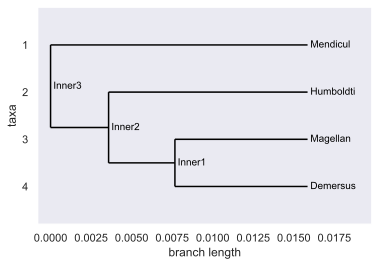

In [57]:
Phylo.draw(tree)

The taxa, numbered 1, 2, 3, and 4, represent the 4 species of Spheniscus penguins (their corresponding names are on the right, abbreviated because the phylip file format only accepts up to 10 characters as input for the species). Inner1 is the last common ancestor between S.magellanicus and S.demersus penguins, Inner2 is the last common ancestor between the ancestral Inner1 species and S.humboldti penguin, and Inner3 is the last common ancestor between species Inner2 and S.mendiculus. The branch length represents evolutionary changes from the beginning of the tree (starting at value 0) to the present day. The larger branch length value between two species, the more closely related they are.

S.magellanicus and S.demersus are the most closely related, as their branch length (the branch length value where their last common ancestor is located) is the largest. Following that, S.humboldti is the next closely related to the two. Then, finally, S.mendiculus is the most distantly related to all of the Spheniscus penguins. Thus, my hypothesis was incorrect. S.magellanicus and S.humboldti are not the most closely related.